In [77]:
## import necessary packages
import pandas as pd
from pandas.plotting import scatter_matrix
import numpy as np
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import scale
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import nbformat
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error
import seaborn as sns
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# Exploratory Data Analysis

In [35]:
##Cleaning for Exploratory Data Analysis

diabetes_filename = 'Diabetes with Population Info by County 2017.csv'
df = pd.read_csv(diabetes_filename, dtype={"CountyFIPS": str}) #CountyFips needs to be a string so leading 0 isn't dropped

df = df[df.Diabetes_Number != "Suppressed"] #drop row with "Suppressed" value in Diabetes_Number
df["Diabetes_Number"] = df["Diabetes_Number"].astype('int64') #convert Diabetes Number to int

df["Diabetes_Number_PC"] = df["Diabetes_Number"] / df["race_total population"] #create diabetes number per capita column


df = df[df["Obesity_Number"] != 'No Data']
df = df[df['Physical_Inactivity_Number'] != "No Data"]

df = df.dropna()

target_col = 'sex and age_total population_65 years and over_sex ratio (males per 100 females)'
df = df[df[target_col] != '-']

##Remove duplicate columns

df = df.drop(columns=['race_total population_one race_1', 'race_total population_two or more races_1',
                     'sex and age_total population_18 years and over_1', 
                      'sex and age_total population_65 years and over_1',
                     ]) 


# shape: 3112*92


## Choropleth Map: Diabates Number by County

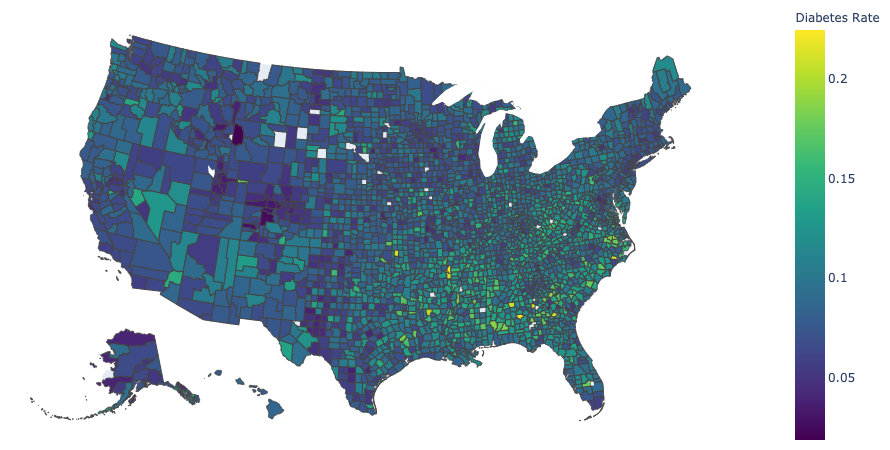

In [11]:
# Documentation relied upon at: https://plotly.com/python/choropleth-maps/
#To install plotly I had to go to terminal and run: conda install -c https://conda.anaconda.org/plotly plotly -LL
#If graphic won't render in JupyterLab, go to https://stackoverflow.com/questions/52771328/plotly-chart-not-showing-in-jupyter-notebook -LL

from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)
    
from plotly import express as px

df_choro = df[['CountyFIPS', 'Diabetes_Number_PC']] #make dataframe with two columns to speed up process

fig = px.choropleth(df_choro, geojson=counties, locations='CountyFIPS', color='Diabetes_Number_PC',
                           color_continuous_scale="Viridis", 
                           scope="usa",
                           labels={'Diabetes_Number_PC':'Diabetes Rate'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## Correlation Plot

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x12d302ee0>,
      dtype=object)

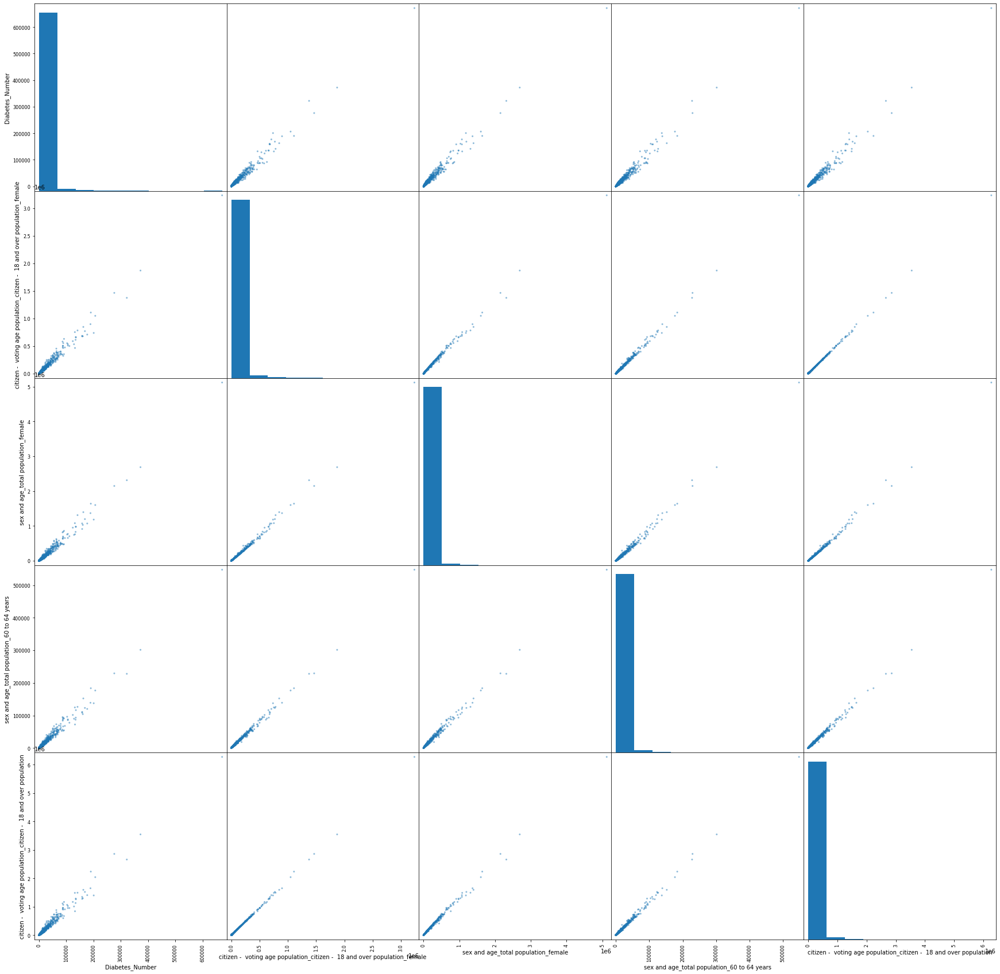

In [36]:
### EDA: get correlation with Diabetes_Number
corr_w_diab_num = df.corr()['Diabetes_Number']
cols = corr_w_diab_num.axes[0].to_list()
col2corr = {col:corr_w_diab_num[col] for col in cols}
col_corr = sorted(col2corr.items(), key=lambda x: x[1])
top_correlated_cols = [p[0] for p in col_corr[-5:][::-1]]
scatter_matrix(df[top_correlated_cols], figsize=(30, 30))

## @Vincent: When possible, can you make the output a little nicer and easier to interpret?
##I also changed it to df intsead of df_cleaned (since the df_cleaned code comes in later cells) 
##but feel free to adjust if that messed things up -LL

# Preparing to Fit Models

In [56]:
### Data cleaning

# drop county and state and diabetes number per capita
df_cleaned = df.drop(columns=['County', 'CountyFIPS', 'State', "Diabetes_Number_PC"])

##In OH, Aniket suggested I try and drop state instead of turning it into dummies. Commented out the code
#below insetad of deleting for now

# convert state to one-hot-encoding
#onehotencoder = OneHotEncoder()
#onehotencoder.fit(df_convert['State'].to_numpy().reshape(-1, 1))
#state_array = onehotencoder.transform(df_convert['State'].to_numpy().reshape(-1, 1)).todense()

#df_states = pd.DataFrame(state_array)
#df_wo_states = df_convert.drop(columns=['State'])
#df_cleaned = pd.concat([df_states, df_wo_states], axis=1)

# drop na
df_cleaned = df_cleaned.dropna()
                        

for col in df_cleaned.columns:
    df_cleaned[col] = df_cleaned[col].astype('float64')



# shape: 3112*88

In [58]:
## Data partition
n_data = df_cleaned.shape[0]
n_train = int(n_data*0.7)
n_valid = int(n_data*0.2)
n_test = n_data - n_train - n_valid

labels = np.repeat(['train', 'valid', 'test'], (n_train, n_valid, n_test))
np.random.seed(0)
randomized_labels = np.random.choice(labels, n_data, replace=False)
df_cleaned['group'] = randomized_labels

df_train = df_cleaned[df_cleaned['group'] == 'train']
df_valid = df_cleaned[df_cleaned['group'] == 'valid']
df_test = df_cleaned[df_cleaned['group'] == 'test']

df_train = df_train.drop(columns=['group'])
df_valid = df_valid.drop(columns=['group'])
df_test = df_test.drop(columns=['group'])

y_train = df_train['Diabetes_Number']
X_train = df_train.drop(columns=['Diabetes_Number'])
y_valid = df_valid['Diabetes_Number']
X_valid = df_valid.drop(columns=['Diabetes_Number'])
X_test = df_test.drop(columns=['Diabetes_Number'])
y_test = df_test['Diabetes_Number']

#standardize features
X_train_scaled = scale(X_train)
X_valid_scaled = scale(X_valid)
X_test_scaled = scale(X_test)

# Training Models

## OLS Regression Model

In [81]:
#Determine hyperparameters to use
param_grid = {'fit_intercept': ['True', 'False'],
              'normalize': ['True', 'False']}

lin_grid_reg = GridSearchCV(LinearRegression(), param_grid, cv=3, iid=False)
lin_grid_reg.fit(X_train_scaled, y_train)

best_index = np.argmax(lin_grid_reg.cv_results_["mean_test_score"])

print(lin_grid_reg.cv_results_["params"][best_index])



{'fit_intercept': 'True', 'normalize': 'True'}


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:847: FutureWarning:

The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.



In [ ]:
#Fit linear regression model on  training data using best hyperparameters
linear_reg = LinearRegression(fit_intercept = True, normalize=True).fit(X_train_scaled, y_train)
linear_y_hat = linear_reg.predict(X_valid_scaled)

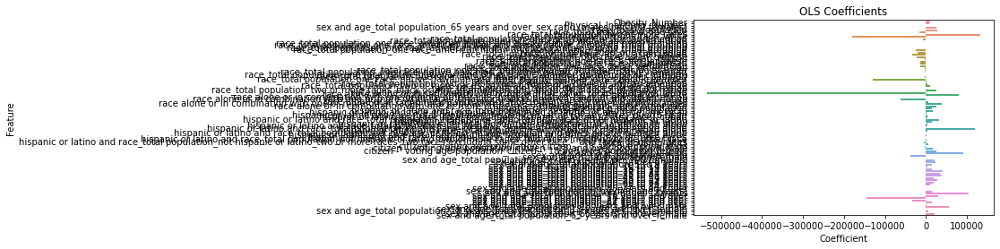

In [82]:
# Create a dataframe with the coefficient and feature names
lin_reg_data = pd.DataFrame([linear_reg.coef_, X_train.columns]).T
lin_reg_data.columns = ['Coefficient', 'Feature']
# Plot
ax = sns.barplot(x="Coefficient", y="Feature", data=lin_reg_data)
ax.set_title("OLS Coefficients")
plt.show()

#will try to clean up this plot at some point... - LL

## Ridge Regression Model

In [90]:
#Determine hyperparameters to use for ridge
param_grid = {'alpha': np.arange(.1, 1, .1),
               'normalize': ['True', 'False'],
             'fit_intercept': ['True', 'False'],
             'solver': ['auto', 'svd', 'cholesky', 'lsqr']}

ridge_grid_reg = GridSearchCV(Ridge(), param_grid, cv=3, iid=False)
ridge_grid_reg.fit(X_train_scaled, y_train)

print(ridge_grid_reg.cv_results_["params"][best_index])




{'alpha': 0.6, 'fit_intercept': 'True', 'normalize': 'True', 'solver': 'lsqr'}


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:847: FutureWarning:

The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.



In [91]:
#Fit ridge regression model on  training data using best hyperparameters
ridge_reg = Ridge(alpha = 0.6, normalize = True, fit_intercept = True, solver = 'lsqr').fit(X_train_scaled, y_train)
ridge_y_hat = ridge_reg.predict(X_valid_scaled)

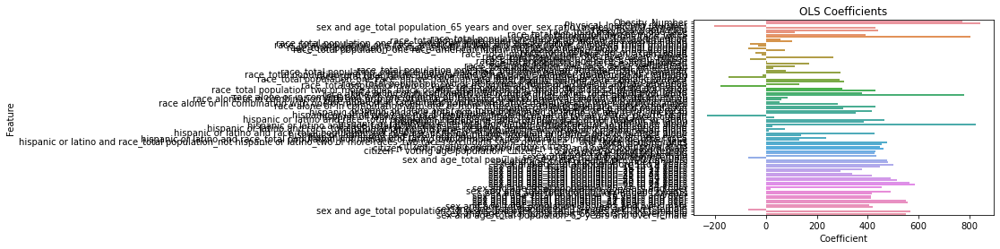

In [89]:
# Create a dataframe with the coefficient and feature names
ridge_reg_data = pd.DataFrame([ridge_reg.coef_, X_train.columns]).T
ridge_reg_data.columns = ['Coefficient', 'Feature']
# Plot
ax = sns.barplot(x="Coefficient", y="Feature", data=ridge_reg_data)
ax.set_title("OLS Coefficients")
plt.show()

#will try to clean up this plot at some point... - LL

## LASSO Regression Model

In [94]:
##Determine hyperparameters to use
param_grid = {'alpha': np.arange(.1, 1, .1),
               'normalize': ['True', 'False'],
             'fit_intercept': ['True', 'False'],
             'selection': ['cyclic', 'random']}

lasso_grid_reg = GridSearchCV(Lasso(max_iter=10000), param_grid, cv=3, iid=False)
lasso_grid_reg.fit(X_train_scaled, y_train)

best_index = np.argmax(lasso_grid_reg.cv_results_["mean_test_score"])
print(lasso_grid_reg.cv_results_["params"][best_index])


{'alpha': 0.9, 'fit_intercept': 'True', 'normalize': 'True', 'selection': 'cyclic'}


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:847: FutureWarning:

The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.



In [95]:
lasso_reg = Lasso(max_iter = 10000, alpha = 0.9, fit_intercept = True, normalize = True, selection = 'cyclic').fit(X_train_scaled, y_train)
lasso_y_hat = lasso_reg.predict(X_valid_scaled)


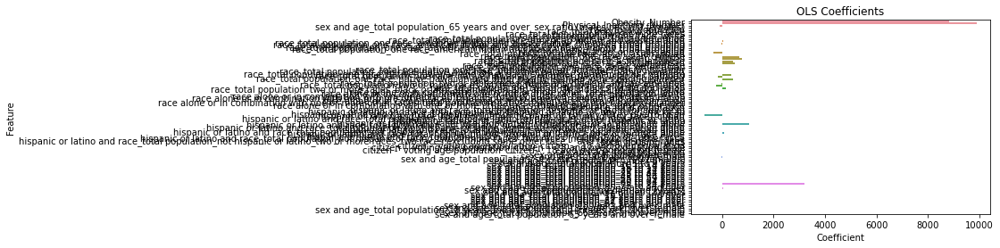

In [96]:
# Create a dataframe with the coefficient and feature names
lasso_reg_data = pd.DataFrame([lasso_reg.coef_, X_train.columns]).T
lasso_reg_data.columns = ['Coefficient', 'Feature']
# Plot
ax = sns.barplot(x="Coefficient", y="Feature", data=lasso_reg_data)
ax.set_title("OLS Coefficients")
plt.show()

In [97]:
mse_linear = mean_squared_error(y_valid, linear_y_hat)
mse_ridge = mean_squared_error(y_valid, ridge_y_hat)
mse_lasso = mean_squared_error(y_valid, lasso_y_hat)

print('MSE linear: ', mse_linear)
print('MSE ridge: ', mse_ridge)
print('MSE lasso: ', mse_lasso)

MSE linear:  585900269.5557622
MSE ridge:  43942066.613667704
MSE lasso:  36661413.88527428
